# 06 — External Car Parts Dataset Audit

## Purpose

This notebook audits the external Humans in the Loop dataset before merging it with the current car-parts segmentation dataset.

The audit will:

- inspect the dataset structure;
- validate image and annotation pairs.
- analyze annotation classes and polygon counts.
- visually review annotation quality.
- define the mapping to the 13 project classes.
- decide which images and annotations are suitable for integration.

No external data will be merged or used for training until this audit is complete.

## 1. Setup


In [2]:
from google.colab import drive

drive.mount("/content/drive")

print("Google Drive mounted successfully.")

Mounted at /content/drive
Google Drive mounted successfully.


In [47]:
from pathlib import Path
from zipfile import ZipFile
from collections import Counter
from sklearn.model_selection import train_test_split
import json
import random
import shutil
import hashlib
import yaml

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

## 2. Configuration and Paths

In [3]:
EXTERNAL_ZIP_PATH = Path(
    "/content/drive/MyDrive/data/external/car-parts-and-car-damages.zip"
)

RAW_DATA_DIR = Path("/content/data/hitl-carparts-raw")
RAW_IMAGES_DIR = RAW_DATA_DIR / "images"
RAW_ANNOTATIONS_DIR = RAW_DATA_DIR / "annotations"

PROCESSED_DATA_DIR = Path("/content/data/hitl-carparts-processed")

if not EXTERNAL_ZIP_PATH.exists():
    raise FileNotFoundError(f"Dataset ZIP not found: {EXTERNAL_ZIP_PATH}")

print("Dataset ZIP:", EXTERNAL_ZIP_PATH.name)
print("Raw data directory:", RAW_DATA_DIR)
print("Processed data directory:", PROCESSED_DATA_DIR)

Dataset ZIP: car-parts-and-car-damages.zip
Raw data directory: /content/data/hitl-carparts-raw
Processed data directory: /content/data/hitl-carparts-processed


In [32]:
CURRENT_DATA_ZIP_PATH = Path(
    "/content/drive/MyDrive/data/carparts-seg-processed.zip"
)

CURRENT_DATA_DIR = Path("/content/data/current-carparts")

## 3. Data Loading

In [6]:
with ZipFile(EXTERNAL_ZIP_PATH, "r") as zip_file:
    zip_contents = zip_file.namelist()

folder_counts = Counter(
    file_path.split("/")[0]
    for file_path in zip_contents
    if "/" in file_path
)

archive_summary_df = pd.DataFrame(
    folder_counts.items(),
    columns=["Folder", "Files"]
).sort_values("Files", ascending=False)

print("Total files inside ZIP:", len(zip_contents))
display(archive_summary_df)

Total files inside ZIP: 7250


,Folder,Files
0,Car damages dataset,3993
1,Car parts dataset,3257


In [7]:
CAR_PARTS_FOLDER = "Car damages dataset/File1"

image_files = [
    file_path
    for file_path in zip_contents
    if file_path.startswith(f"{CAR_PARTS_FOLDER}/img/")
    and file_path.lower().endswith((".jpg", ".jpeg", ".png"))
]

annotation_files = [
    file_path
    for file_path in zip_contents
    if file_path.startswith(f"{CAR_PARTS_FOLDER}/ann/")
    and file_path.lower().endswith(".json")
]

loading_summary_df = pd.DataFrame({
    "File Type": ["Images", "Annotations"],
    "Count": [len(image_files), len(annotation_files)]
})

display(loading_summary_df)

,File Type,Count
0,Images,998
1,Annotations,998


In [8]:
RAW_IMAGES_DIR.mkdir(parents=True, exist_ok=True)
RAW_ANNOTATIONS_DIR.mkdir(parents=True, exist_ok=True)

with ZipFile(EXTERNAL_ZIP_PATH, "r") as zip_file:
    for file_path in image_files:
        file_name = file_path.split("/")[-1]
        output_path = RAW_IMAGES_DIR / file_name
        output_path.write_bytes(zip_file.read(file_path))

    for file_path in annotation_files:
        file_name = file_path.split("/")[-1]
        output_path = RAW_ANNOTATIONS_DIR / file_name
        output_path.write_bytes(zip_file.read(file_path))

print("Extracted images:", len(list(RAW_IMAGES_DIR.iterdir())))
print("Extracted annotations:", len(list(RAW_ANNOTATIONS_DIR.iterdir())))

Extracted images: 998
Extracted annotations: 998


## 4. Data Validation

In [10]:
image_names = {
    file_path.name
    for file_path in RAW_IMAGES_DIR.iterdir()
    if file_path.is_file()
}

annotated_image_names = {
    file_path.name.removesuffix(".json")
    for file_path in RAW_ANNOTATIONS_DIR.glob("*.json")
}

missing_annotations = image_names - annotated_image_names
orphan_annotations = annotated_image_names - image_names

pair_validation_df = pd.DataFrame({
    "Check": [
        "Images",
        "Annotations",
        "Missing Annotations",
        "Orphan Annotations"
    ],
    "Count": [
        len(image_names),
        len(annotated_image_names),
        len(missing_annotations),
        len(orphan_annotations)
    ]
})

display(pair_validation_df)

,Check,Count
0,Images,998
1,Annotations,998
2,Missing Annotations,0
3,Orphan Annotations,0


In [11]:
annotations = {}

unreadable_files = 0
invalid_image_sizes = 0
empty_annotations = 0
non_polygon_objects = 0
invalid_polygons = 0

for annotation_path in RAW_ANNOTATIONS_DIR.glob("*.json"):
    try:
        annotation = json.loads(
            annotation_path.read_text(encoding="utf-8-sig")
        )
    except (json.JSONDecodeError, UnicodeDecodeError):
        unreadable_files += 1
        continue

    image_name = annotation_path.name.removesuffix(".json")
    annotations[image_name] = annotation

    width = annotation.get("size", {}).get("width", 0)
    height = annotation.get("size", {}).get("height", 0)
    objects = annotation.get("objects", [])

    if width <= 0 or height <= 0:
        invalid_image_sizes += 1

    if not objects:
        empty_annotations += 1

    for annotated_object in objects:
        if annotated_object.get("geometryType") != "polygon":
            non_polygon_objects += 1
            continue

        points = annotated_object.get("points", {}).get("exterior", [])

        if len(points) < 3:
            invalid_polygons += 1

annotation_validation_df = pd.DataFrame({
    "Check": [
        "Readable Annotation Files",
        "Unreadable Files",
        "Invalid Image Sizes",
        "Empty Annotations",
        "Non-Polygon Objects",
        "Invalid Polygons"
    ],
    "Count": [
        len(annotations),
        unreadable_files,
        invalid_image_sizes,
        empty_annotations,
        non_polygon_objects,
        invalid_polygons
    ]
})

display(annotation_validation_df)

,Check,Count
0,Readable Annotation Files,998
1,Unreadable Files,0
2,Invalid Image Sizes,0
3,Empty Annotations,0
4,Non-Polygon Objects,0
5,Invalid Polygons,0


## 5. Analysis and Visualization

In [12]:
class_instances = Counter()
class_images = Counter()

for annotation in annotations.values():
    classes_in_image = set()

    for annotated_object in annotation["objects"]:
        class_name = annotated_object["classTitle"]

        class_instances[class_name] += 1
        classes_in_image.add(class_name)

    for class_name in classes_in_image:
        class_images[class_name] += 1

class_distribution_df = pd.DataFrame({
    "Class": class_instances.keys(),
    "Instances": class_instances.values(),
    "Images": [
        class_images[class_name]
        for class_name in class_instances.keys()
    ]
}).sort_values("Instances", ascending=False).reset_index(drop=True)

display(class_distribution_df)

,Class,Instances,Images
0,Back-window,1237,812
1,Mirror,987,839
2,Front-window,951,826
3,Fender,935,895
4,Front-door,917,905
5,Headlight,914,658
6,Front-wheel,885,879
7,Back-wheel,865,856
8,Rocker-panel,860,858
9,Quarter-panel,855,838


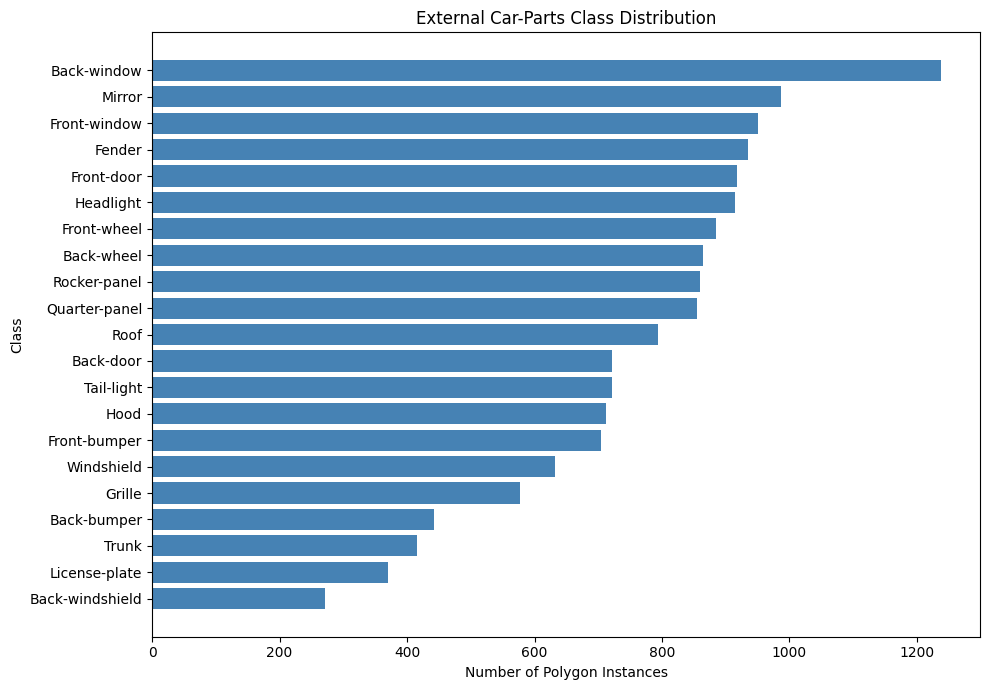

In [13]:
plot_data = class_distribution_df.sort_values("Instances")

plt.figure(figsize=(10, 7))
plt.barh(
    plot_data["Class"],
    plot_data["Instances"],
    color="steelblue"
)

plt.title("External Car-Parts Class Distribution")
plt.xlabel("Number of Polygon Instances")
plt.ylabel("Class")
plt.tight_layout()
plt.show()

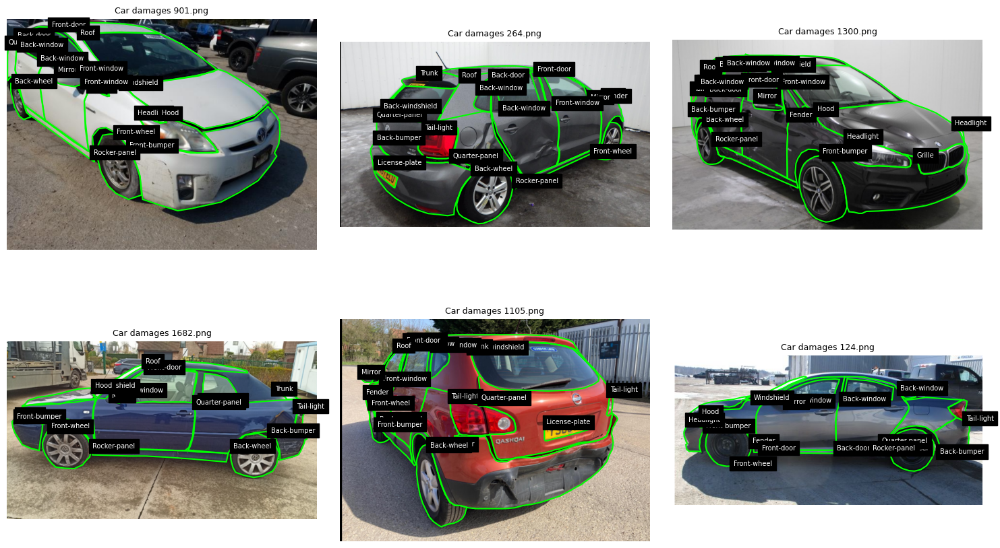

In [20]:
from matplotlib.patches import Polygon

random.seed(42)
sample_images = random.sample(list(annotations), 6)

figure, axes = plt.subplots(2, 3, figsize=(15, 10))

for image_name, axis in zip(sample_images, axes.flatten()):
    image = Image.open(RAW_IMAGES_DIR / image_name)
    axis.imshow(image)

    for annotated_object in annotations[image_name]["objects"]:
        points = annotated_object["points"]["exterior"]
        class_name = annotated_object["classTitle"]

        polygon = Polygon(
            points,
            fill=False,
            edgecolor="lime",
            linewidth=1.5
        )

        axis.add_patch(polygon)
        axis.text(
            points[0][0],
            points[0][1],
            class_name,
            color="white",
            fontsize=7,
            backgroundcolor="black"
        )

    axis.set_title(image_name, fontsize=9)
    axis.axis("off")

plt.tight_layout()
plt.show()

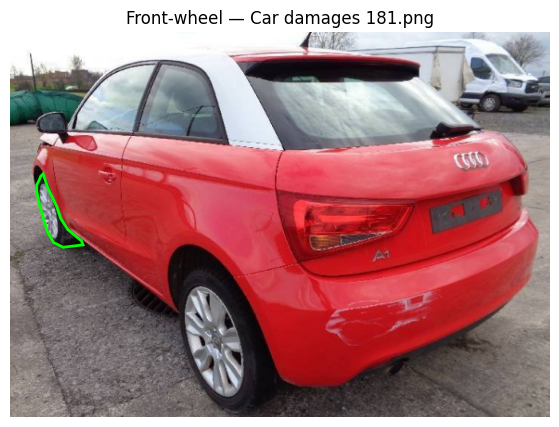

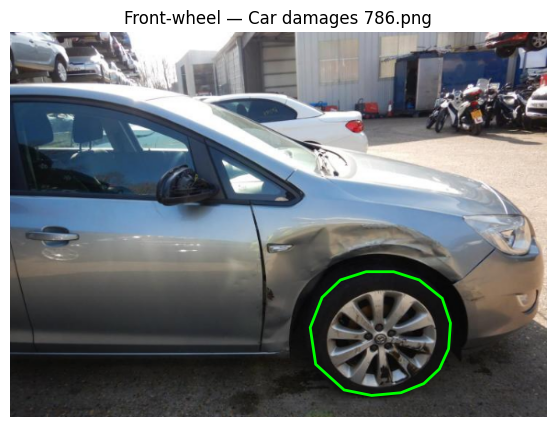

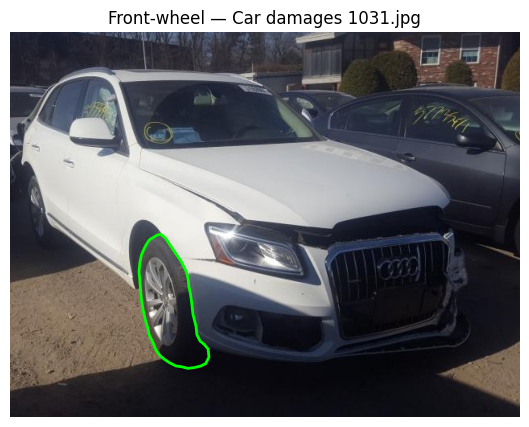

In [21]:
class_to_check = "Front-wheel"

matching_images = [
    image_name
    for image_name, annotation in annotations.items()
    if class_to_check in [
        obj["classTitle"]
        for obj in annotation["objects"]
    ]
]

random.seed(42)

for image_name in random.sample(matching_images, 3):
    image = Image.open(RAW_IMAGES_DIR / image_name)

    figure, axis = plt.subplots(figsize=(7, 5))
    axis.imshow(image)

    for obj in annotations[image_name]["objects"]:
        if obj["classTitle"] == class_to_check:
            axis.add_patch(
                Polygon(
                    obj["points"]["exterior"],
                    fill=False,
                    edgecolor="lime",
                    linewidth=2
                )
            )

    axis.set_title(f"{class_to_check} — {image_name}")
    axis.axis("off")
    plt.show()

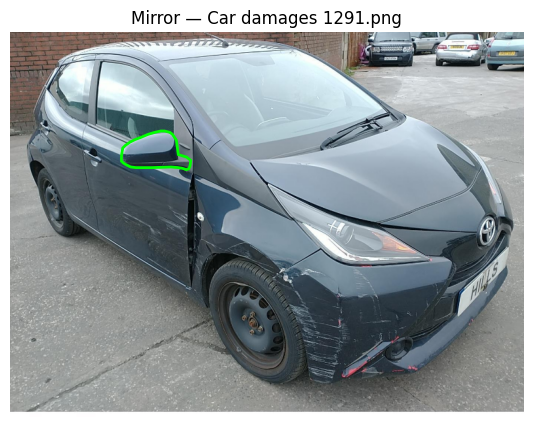

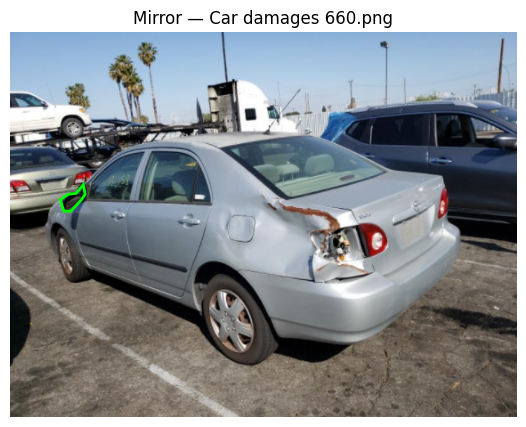

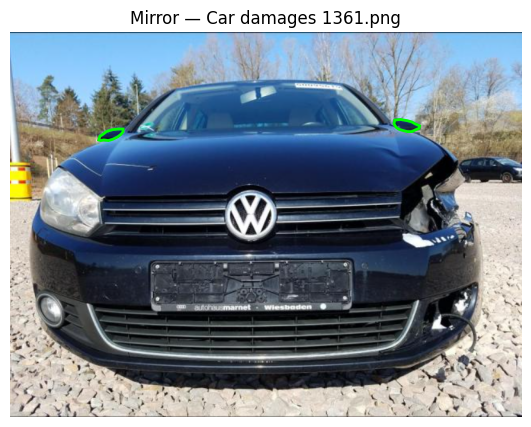

In [22]:
class_to_check = "Mirror"

matching_images = [
    image_name
    for image_name, annotation in annotations.items()
    if class_to_check in [
        obj["classTitle"]
        for obj in annotation["objects"]
    ]
]

random.seed(42)

for image_name in random.sample(matching_images, 3):
    image = Image.open(RAW_IMAGES_DIR / image_name)

    figure, axis = plt.subplots(figsize=(7, 5))
    axis.imshow(image)

    for obj in annotations[image_name]["objects"]:
        if obj["classTitle"] == class_to_check:
            axis.add_patch(
                Polygon(
                    obj["points"]["exterior"],
                    fill=False,
                    edgecolor="lime",
                    linewidth=2
                )
            )

    axis.set_title(f"{class_to_check} — {image_name}")
    axis.axis("off")
    plt.show()

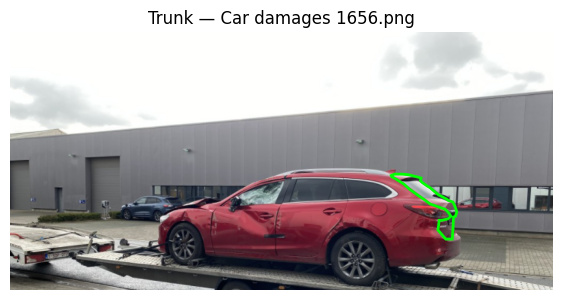

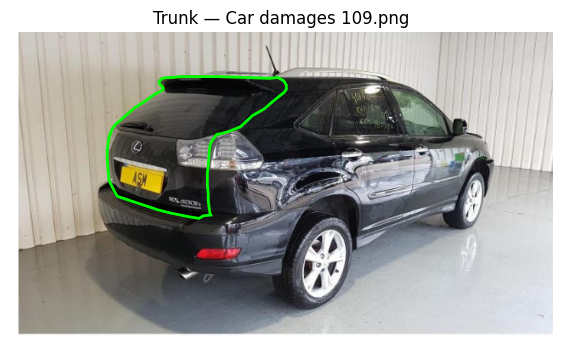

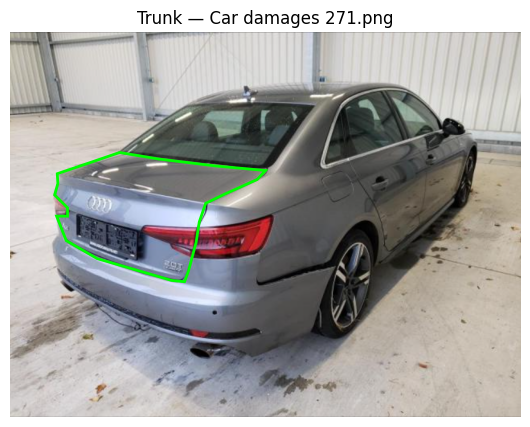

In [23]:
class_to_check = "Trunk"

matching_images = [
    image_name
    for image_name, annotation in annotations.items()
    if class_to_check in [
        obj["classTitle"]
        for obj in annotation["objects"]
    ]
]

random.seed(42)

for image_name in random.sample(matching_images, 3):
    image = Image.open(RAW_IMAGES_DIR / image_name)

    figure, axis = plt.subplots(figsize=(7, 5))
    axis.imshow(image)

    for obj in annotations[image_name]["objects"]:
        if obj["classTitle"] == class_to_check:
            axis.add_patch(
                Polygon(
                    obj["points"]["exterior"],
                    fill=False,
                    edgecolor="lime",
                    linewidth=2
                )
            )

    axis.set_title(f"{class_to_check} — {image_name}")
    axis.axis("off")
    plt.show()

## 6. Processing

In [24]:
project_classes = [
    "back_bumper",
    "back_door",
    "back_glass",
    "back_light",
    "front_bumper",
    "front_door",
    "front_glass",
    "front_light",
    "hood",
    "side_mirror",
    "tailgate",
    "trunk",
    "wheel"
]

class_mapping = {
    "Back-bumper": "back_bumper",
    "Back-door": "back_door",
    "Back-windshield": "back_glass",
    "Tail-light": "back_light",
    "Front-bumper": "front_bumper",
    "Front-door": "front_door",
    "Windshield": "front_glass",
    "Headlight": "front_light",
    "Hood": "hood",
    "Mirror": "side_mirror",
    "Trunk": "trunk",
    "Front-wheel": "wheel",
    "Back-wheel": "wheel"
}

class_ids = {
    class_name: class_id
    for class_id, class_name in enumerate(project_classes)
}

mapping_df = pd.DataFrame(
    class_mapping.items(),
    columns=["External Class", "Project Class"]
)

mapping_df["Class ID"] = mapping_df["Project Class"].map(class_ids)

display(mapping_df)

,External Class,Project Class,Class ID
0,Back-bumper,back_bumper,0
1,Back-door,back_door,1
2,Back-windshield,back_glass,2
3,Tail-light,back_light,3
4,Front-bumper,front_bumper,4
5,Front-door,front_door,5
6,Windshield,front_glass,6
7,Headlight,front_light,7
8,Hood,hood,8
9,Mirror,side_mirror,9


In [25]:
mapped_instances = Counter()
mapped_images = Counter()
images_with_mapped_classes = 0

for annotation in annotations.values():
    classes_in_image = set()

    for obj in annotation["objects"]:
        external_class = obj["classTitle"]

        if external_class in class_mapping:
            project_class = class_mapping[external_class]
            mapped_instances[project_class] += 1
            classes_in_image.add(project_class)

    if classes_in_image:
        images_with_mapped_classes += 1

    for project_class in classes_in_image:
        mapped_images[project_class] += 1

mapped_distribution_df = pd.DataFrame({
    "Class": project_classes,
    "Instances": [
        mapped_instances[class_name]
        for class_name in project_classes
    ],
    "Images": [
        mapped_images[class_name]
        for class_name in project_classes
    ]
})

display(mapped_distribution_df)

print("Images with mapped classes:", images_with_mapped_classes)
print(
    "Images without mapped classes:",
    len(annotations) - images_with_mapped_classes
)
print("Mapped polygons:", sum(mapped_instances.values()))

,Class,Instances,Images
0,back_bumper,443,441
1,back_door,721,714
2,back_glass,271,270
3,back_light,721,470
4,front_bumper,705,693
5,front_door,917,905
6,front_glass,632,631
7,front_light,914,658
8,hood,712,712
9,side_mirror,987,839


Images with mapped classes: 998
Images without mapped classes: 0
Mapped polygons: 9189


In [26]:
converted_images_dir = PROCESSED_DATA_DIR / "images" / "all"
converted_labels_dir = PROCESSED_DATA_DIR / "labels" / "all"

converted_images_dir.mkdir(parents=True, exist_ok=True)
converted_labels_dir.mkdir(parents=True, exist_ok=True)

for image_name, annotation in annotations.items():
    width = annotation["size"]["width"]
    height = annotation["size"]["height"]

    yolo_lines = []

    for obj in annotation["objects"]:
        external_class = obj["classTitle"]

        if external_class not in class_mapping:
            continue

        project_class = class_mapping[external_class]
        class_id = class_ids[project_class]
        points = obj["points"]["exterior"]

        normalized_points = []

        for x, y in points:
            normalized_points.append(f"{x / width:.6f}")
            normalized_points.append(f"{y / height:.6f}")

        yolo_line = f"{class_id} " + " ".join(normalized_points)
        yolo_lines.append(yolo_line)

    output_image_name = "hitl_" + image_name.replace(" ", "_")
    output_label_name = Path(output_image_name).stem + ".txt"

    shutil.copy2(
        RAW_IMAGES_DIR / image_name,
        converted_images_dir / output_image_name
    )

    (converted_labels_dir / output_label_name).write_text(
        "\n".join(yolo_lines),
        encoding="utf-8"
    )

print("Converted images:", len(list(converted_images_dir.iterdir())))
print("Converted labels:", len(list(converted_labels_dir.iterdir())))

Converted images: 998
Converted labels: 998


In [27]:
image_stems = {
    path.stem
    for path in converted_images_dir.iterdir()
}

label_files = list(converted_labels_dir.glob("*.txt"))
label_stems = {
    path.stem
    for path in label_files
}

empty_labels = 0
invalid_class_ids = 0
invalid_polygons = 0
out_of_range_coordinates = 0
polygon_count = 0

for label_path in label_files:
    lines = label_path.read_text().strip().splitlines()

    if not lines:
        empty_labels += 1

    for line in lines:
        values = line.split()
        class_id = int(values[0])
        coordinates = [float(value) for value in values[1:]]

        polygon_count += 1

        if class_id not in class_ids.values():
            invalid_class_ids += 1

        if len(coordinates) < 6 or len(coordinates) % 2 != 0:
            invalid_polygons += 1

        if any(value < 0 or value > 1 for value in coordinates):
            out_of_range_coordinates += 1

conversion_validation_df = pd.DataFrame({
    "Check": [
        "Images",
        "Labels",
        "Missing Labels",
        "Orphan Labels",
        "Empty Labels",
        "Polygons",
        "Invalid Class IDs",
        "Invalid Polygons",
        "Out-of-Range Coordinates"
    ],
    "Count": [
        len(image_stems),
        len(label_stems),
        len(image_stems - label_stems),
        len(label_stems - image_stems),
        empty_labels,
        polygon_count,
        invalid_class_ids,
        invalid_polygons,
        out_of_range_coordinates
    ]
})

display(conversion_validation_df)

,Check,Count
0,Images,998
1,Labels,998
2,Missing Labels,0
3,Orphan Labels,0
4,Empty Labels,0
5,Polygons,9189
6,Invalid Class IDs,0
7,Invalid Polygons,0
8,Out-of-Range Coordinates,0


In [31]:
image_hash_records = []

for image_path in converted_images_dir.iterdir():
    file_hash = hashlib.sha256(
        image_path.read_bytes()
    ).hexdigest()

    image_hash_records.append({
        "Image": image_path.name,
        "Hash": file_hash
    })

image_hash_df = pd.DataFrame(image_hash_records)

exact_duplicates_df = image_hash_df[
    image_hash_df.duplicated("Hash", keep=False)
].sort_values("Hash")

print("Duplicate groups:", exact_duplicates_df["Hash"].nunique())
print("Images involved:", len(exact_duplicates_df))

Duplicate groups: 0
Images involved: 0


In [33]:
CURRENT_DATA_DIR.mkdir(parents=True, exist_ok=True)

shutil.unpack_archive(
    CURRENT_DATA_ZIP_PATH,
    CURRENT_DATA_DIR
)

current_image_paths = []

for file_extension in ["*.jpg", "*.jpeg", "*.png"]:
    current_image_paths.extend(
        CURRENT_DATA_DIR.rglob(file_extension)
    )

print("Current dataset images:", len(current_image_paths))

Current dataset images: 3686


In [35]:
current_hash_records = []

for image_path in current_image_paths:
    file_hash = hashlib.sha256(
        image_path.read_bytes()
    ).hexdigest()

    current_hash_records.append({
        "Current Image": image_path.name,
        "Hash": file_hash
    })

current_hash_df = pd.DataFrame(current_hash_records)

cross_dataset_duplicates_df = image_hash_df.merge(
    current_hash_df,
    on="Hash"
).rename(columns={
    "Image": "External Image"
})

print(
    "Exact matches between datasets:",
    len(cross_dataset_duplicates_df)
)

Exact matches between datasets: 0


In [37]:
def create_visual_hash(image_path):
    image = Image.open(image_path).convert("L")
    image = image.resize((8, 8))

    pixels = np.array(image)
    return pixels > pixels.mean()

In [38]:
external_visual_hashes = []

for image_path in converted_images_dir.iterdir():
    external_visual_hashes.append({
        "Image": image_path.name,
        "Hash": create_visual_hash(image_path)
    })

current_visual_hashes = []

for image_path in current_image_paths:
    current_visual_hashes.append({
        "Image": image_path.name,
        "Hash": create_visual_hash(image_path)
    })

In [39]:
similar_images = []

for external_image in external_visual_hashes:
    for current_image in current_visual_hashes:
        difference = np.count_nonzero(
            external_image["Hash"] != current_image["Hash"]
        )

        if difference <= 3:
            similar_images.append({
                "External Image": external_image["Image"],
                "Current Image": current_image["Image"],
                "Difference": difference
            })

similar_images_df = pd.DataFrame(similar_images)

print("Visually similar image pairs:", len(similar_images_df))
display(similar_images_df.head(20))

Visually similar image pairs: 11


,External Image,Current Image,Difference
0,hitl_Car_damages_1744.png,train148_jpg.rf.f6197057d63af8cccbad65b3ca2f38...,3
1,hitl_Car_damages_1081.png,train204_jpg.rf.73481c1470cede84f4061bf758e198...,3
2,hitl_Car_damages_1478.png,train395_jpg.rf.7afcf2137f30c2d78f8043aad5e6ff...,3
3,hitl_Car_damages_1459.png,train205_jpg.rf.546d7b70171129d9ade8b4c6ae84a3...,3
4,hitl_Car_damages_1459.png,train205_jpg.rf.e360c6dd79f75ebb20a7abe7bc8455...,3
5,hitl_Car_damages_266.png,train303_jpg.rf.ec09e9a6996d45102bdbbdd1af15a7...,2
6,hitl_Car_damages_309.png,train307_jpg.rf.28bed4aad90b8f0c9fedc56dd1d418...,3
7,hitl_Car_damages_1651.png,train245_jpg.rf.061bf0620935834625f476fca0aec9...,3
8,hitl_Car_damages_162.png,train269_jpg.rf.cb45c2e2146a8f13c4c0e309fd0d94...,3
9,hitl_Car_damages_116.png,train341_jpg.rf.98d882f1adcf54c8bd5ab384ecd9ee...,3


Pair 0
External: hitl_Car_damages_1744.png
Current: train148_jpg.rf.f6197057d63af8cccbad65b3ca2f383c.jpg
Difference: 3


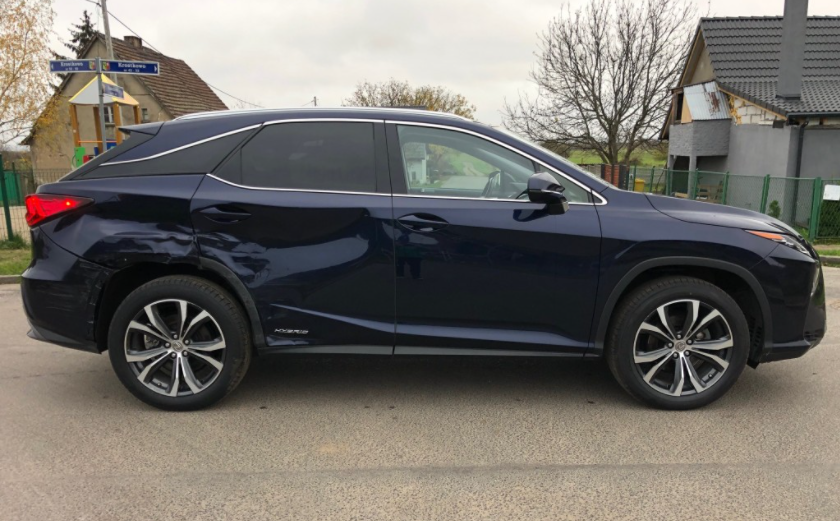

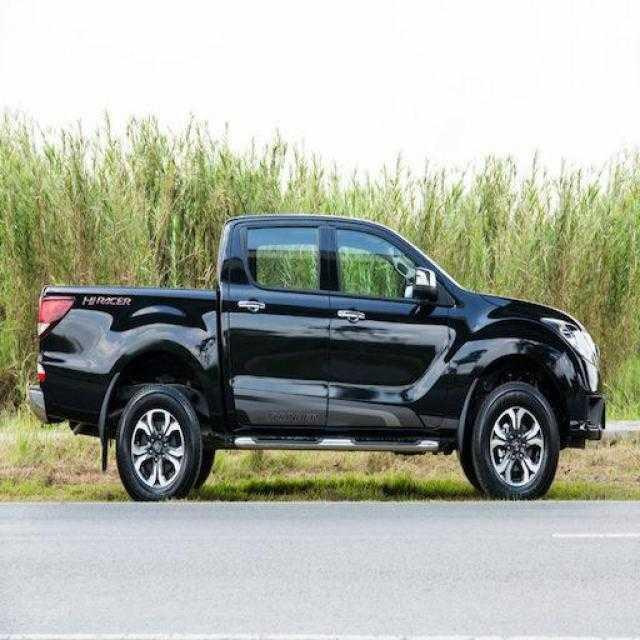

Pair 1
External: hitl_Car_damages_1081.png
Current: train204_jpg.rf.73481c1470cede84f4061bf758e1981d.jpg
Difference: 3


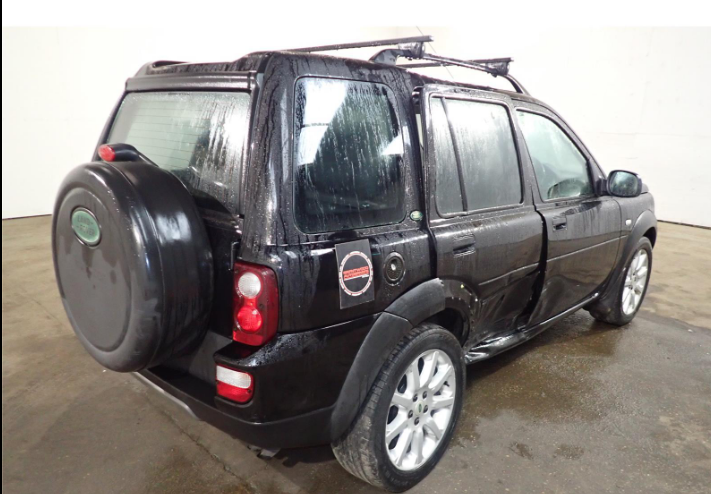

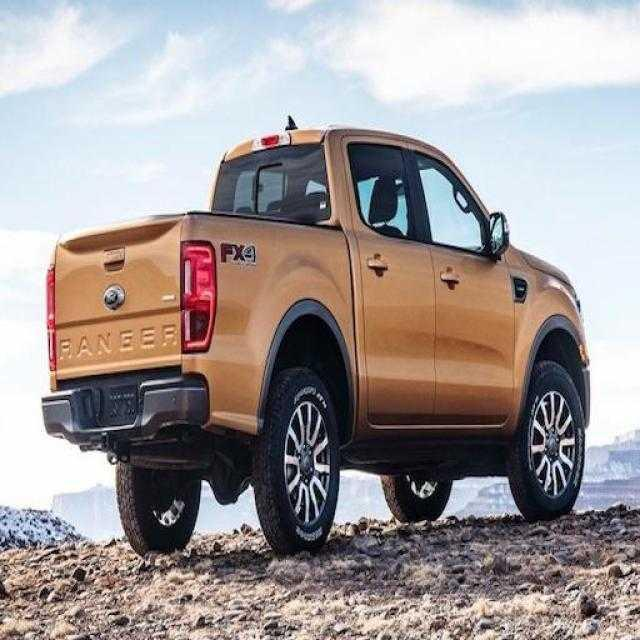

Pair 2
External: hitl_Car_damages_1478.png
Current: train395_jpg.rf.7afcf2137f30c2d78f8043aad5e6ffeb.jpg
Difference: 3


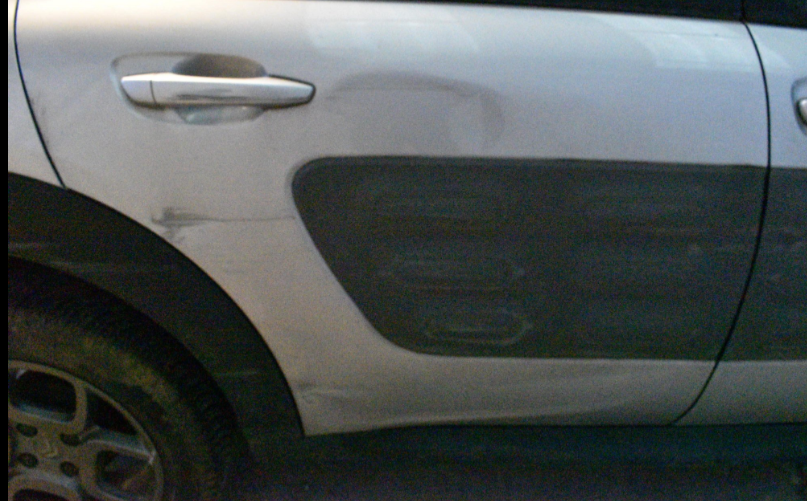

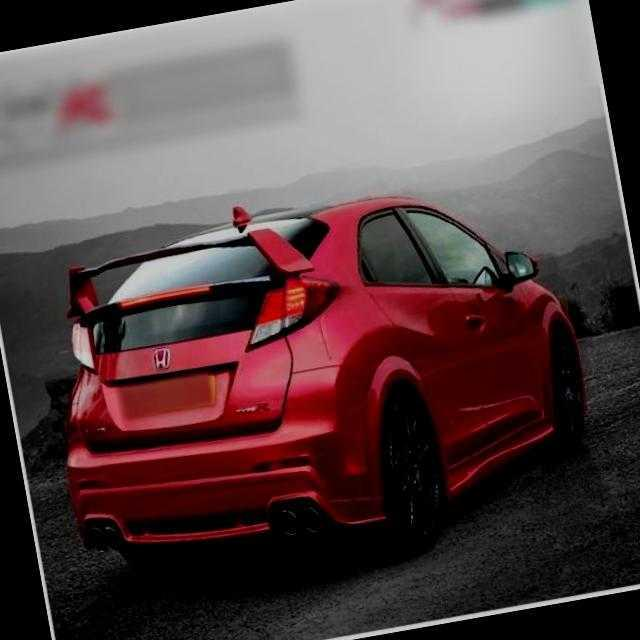

Pair 3
External: hitl_Car_damages_1459.png
Current: train205_jpg.rf.546d7b70171129d9ade8b4c6ae84a321.jpg
Difference: 3


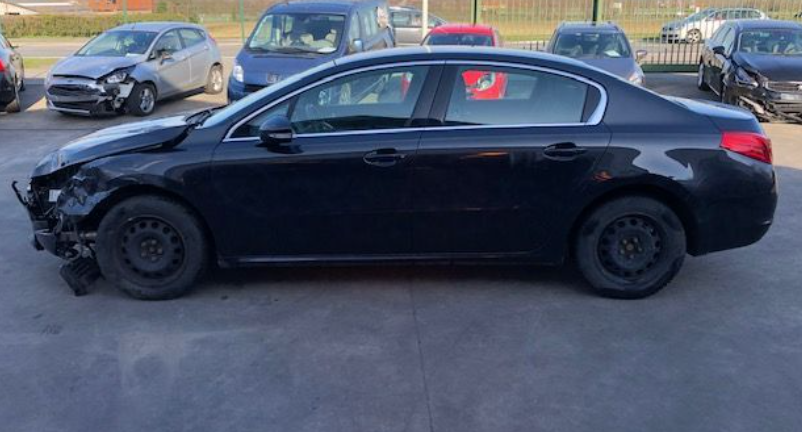

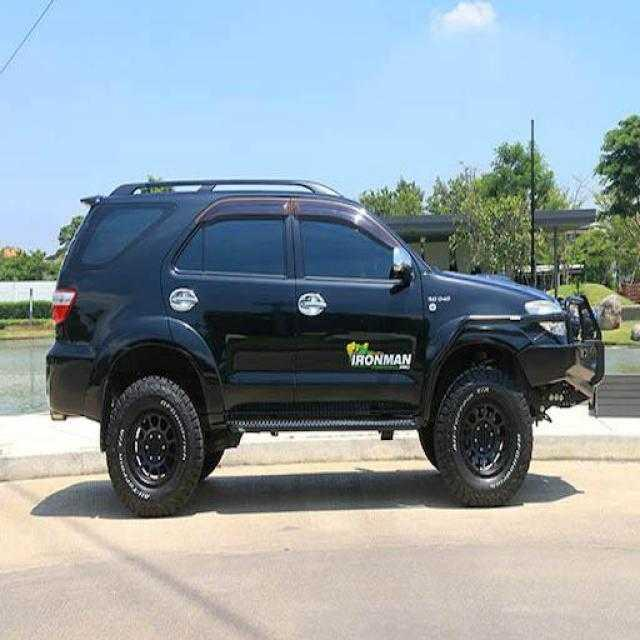

Pair 4
External: hitl_Car_damages_1459.png
Current: train205_jpg.rf.e360c6dd79f75ebb20a7abe7bc845505.jpg
Difference: 3


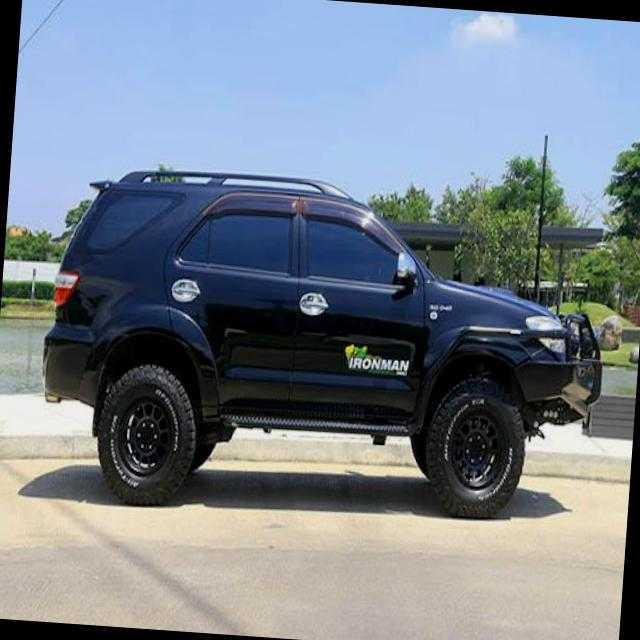

Pair 5
External: hitl_Car_damages_266.png
Current: train303_jpg.rf.ec09e9a6996d45102bdbbdd1af15a74e.jpg
Difference: 2


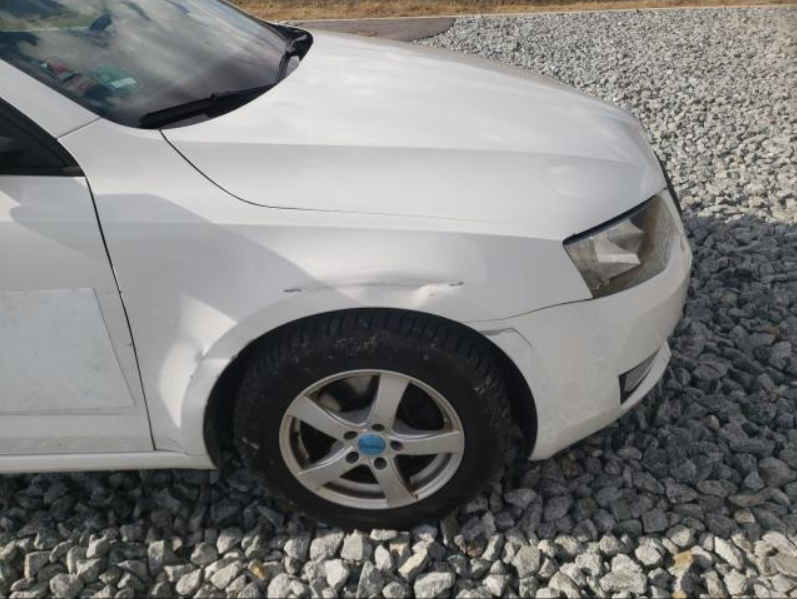

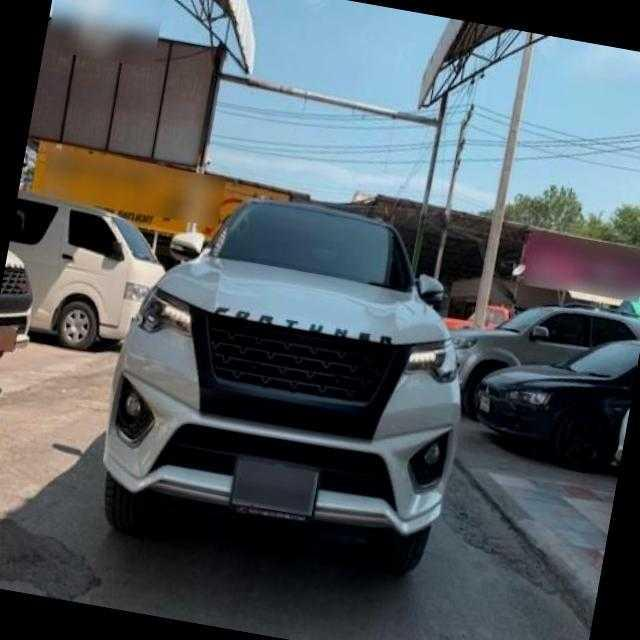

Pair 6
External: hitl_Car_damages_309.png
Current: train307_jpg.rf.28bed4aad90b8f0c9fedc56dd1d41872.jpg
Difference: 3


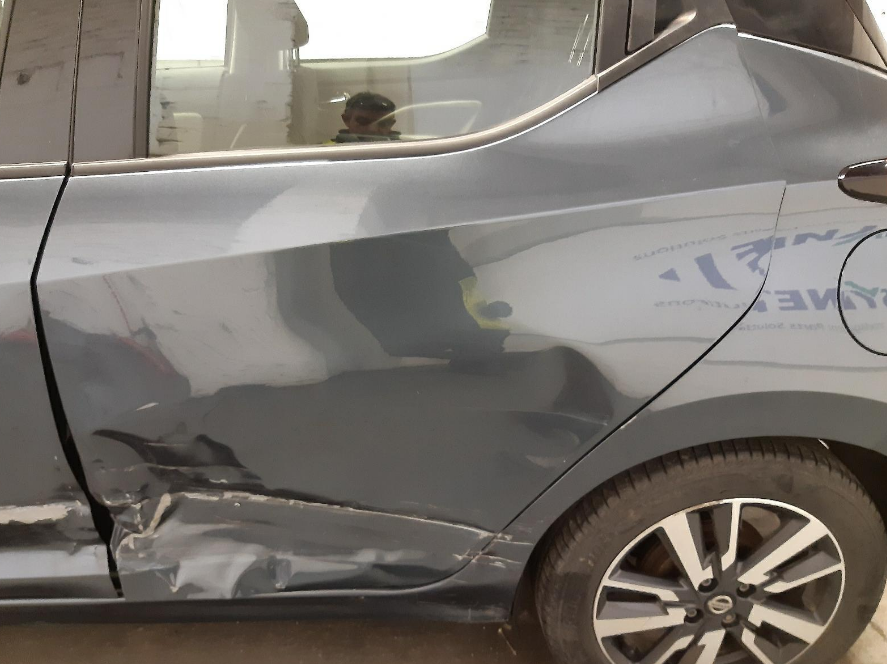

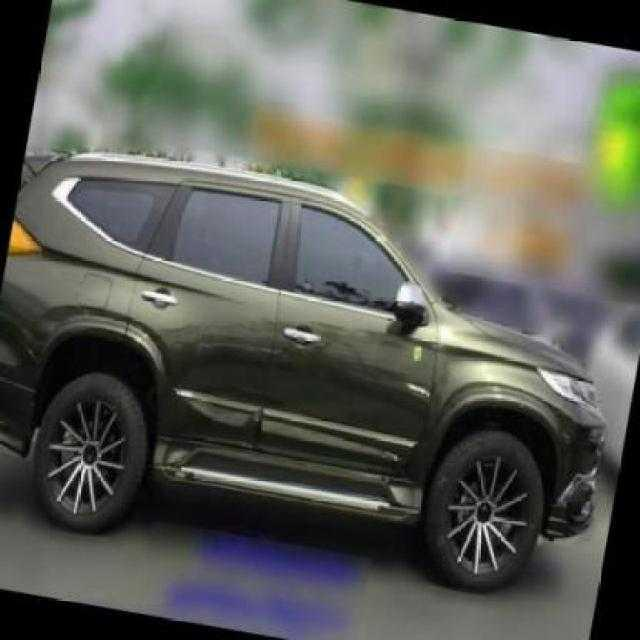

Pair 7
External: hitl_Car_damages_1651.png
Current: train245_jpg.rf.061bf0620935834625f476fca0aec9e4.jpg
Difference: 3


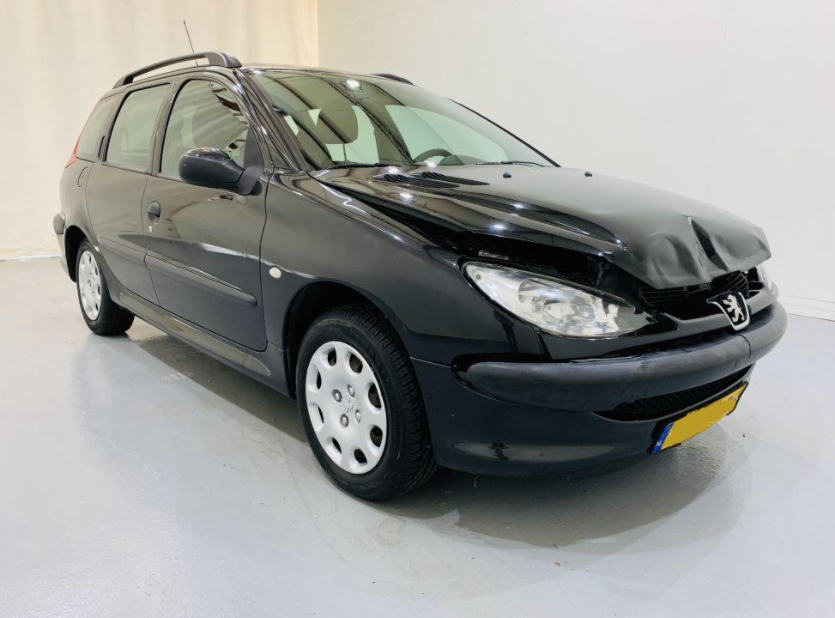

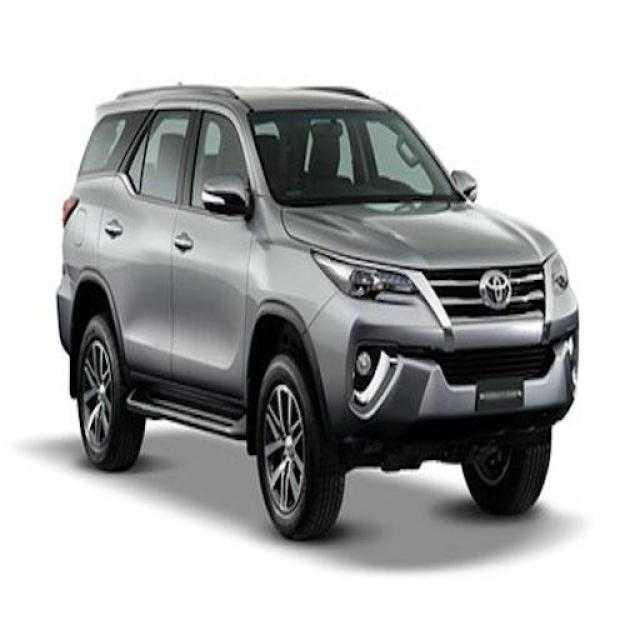

Pair 8
External: hitl_Car_damages_162.png
Current: train269_jpg.rf.cb45c2e2146a8f13c4c0e309fd0d94de.jpg
Difference: 3


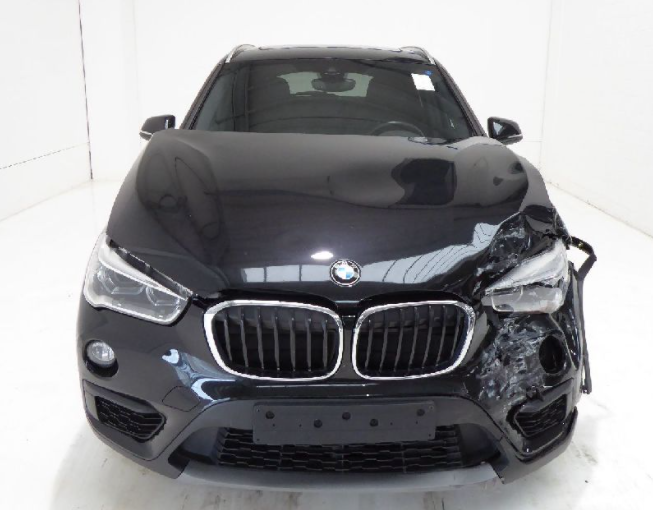

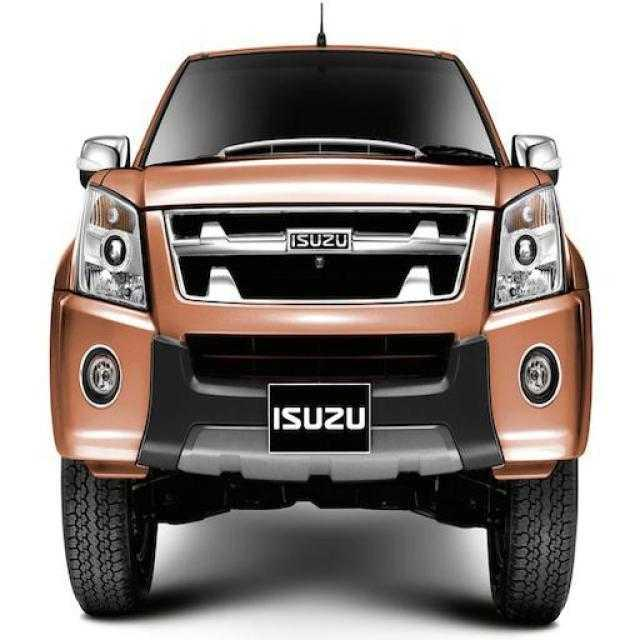

Pair 9
External: hitl_Car_damages_116.png
Current: train341_jpg.rf.98d882f1adcf54c8bd5ab384ecd9ee09.jpg
Difference: 3


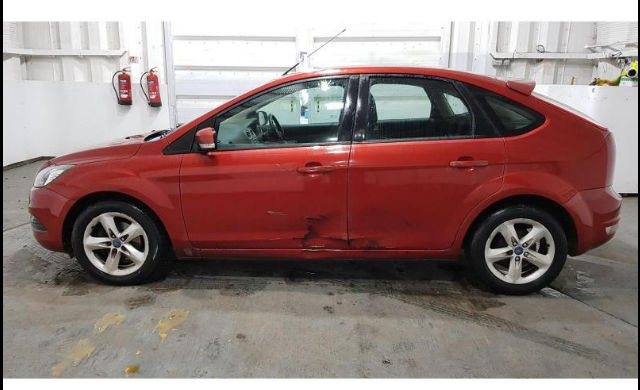

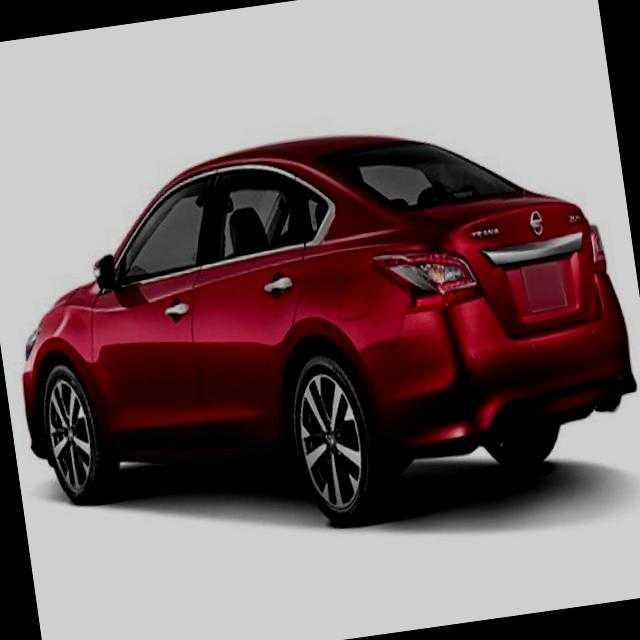

Pair 10
External: hitl_Car_damages_116.png
Current: train341_jpg.rf.e0d28a260fc9549fadcdcee793ac6b9b.jpg
Difference: 3


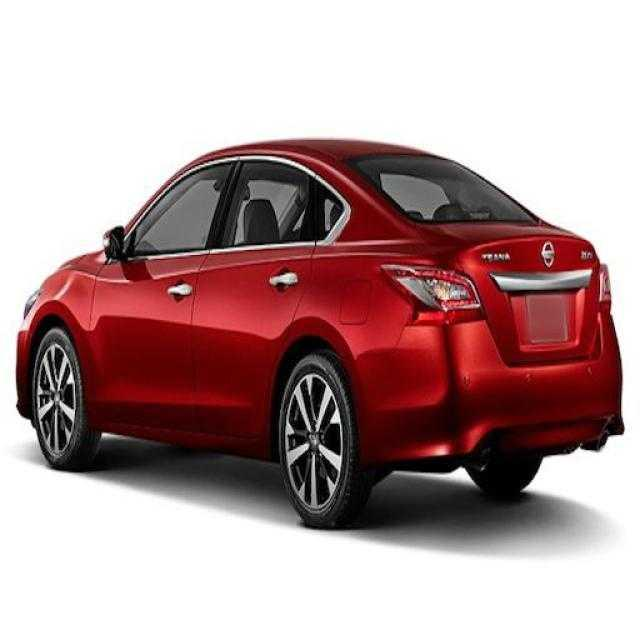

In [40]:
for pair_number, row in similar_images_df.iterrows():
    current_path = next(
        path
        for path in current_image_paths
        if path.name == row["Current Image"]
    )

    print(f"Pair {pair_number}")
    print("External:", row["External Image"])
    print("Current:", row["Current Image"])
    print("Difference:", row["Difference"])

    display(
        Image.open(converted_images_dir / row["External Image"]),
        Image.open(current_path)
    )

In [44]:
external_image_names = sorted(
    path.name
    for path in converted_images_dir.iterdir()
)

train_images, remaining_images = train_test_split(
    external_image_names,
    test_size=0.3,
    random_state=42
)

val_images, test_images = train_test_split(
    remaining_images,
    test_size=0.5,
    random_state=42
)

external_split_df = pd.DataFrame({
    "Image": train_images + val_images + test_images,
    "Split": (
        ["train"] * len(train_images)
        + ["val"] * len(val_images)
        + ["test"] * len(test_images)
    )
})

display(
    external_split_df["Split"]
    .value_counts()
    .rename_axis("Split")
    .reset_index(name="Images")
)

,Split,Images
0,train,698
1,val,150
2,test,150


In [45]:
split_class_records = []

for split_name in ["train", "val", "test"]:
    split_images = external_split_df.loc[
        external_split_df["Split"] == split_name,
        "Image"
    ]

    class_image_counts = Counter()

    for image_name in split_images:
        label_path = converted_labels_dir / (
            Path(image_name).stem + ".txt"
        )

        class_ids_in_image = {
            int(line.split()[0])
            for line in label_path.read_text().splitlines()
        }

        for class_id in class_ids_in_image:
            class_image_counts[project_classes[class_id]] += 1

    for class_name in project_classes:
        split_class_records.append({
            "Class": class_name,
            "Split": split_name,
            "Images": class_image_counts[class_name]
        })

class_split_df = pd.DataFrame(split_class_records)

class_split_table = class_split_df.pivot(
    index="Class",
    columns="Split",
    values="Images"
).reindex(project_classes)

display(class_split_table[["train", "val", "test"]])

Split,train,val,test
Class,,,
back_bumper,314,71,56
back_door,506,112,96
back_glass,195,43,32
back_light,329,70,71
front_bumper,479,104,110
front_door,632,140,133
front_glass,432,96,103
front_light,450,101,107
hood,491,108,113


In [46]:
for split_name in ["train", "val", "test"]:
    images_dir = PROCESSED_DATA_DIR / "images" / split_name
    labels_dir = PROCESSED_DATA_DIR / "labels" / split_name

    if images_dir.exists():
        shutil.rmtree(images_dir)

    if labels_dir.exists():
        shutil.rmtree(labels_dir)

    images_dir.mkdir(parents=True)
    labels_dir.mkdir(parents=True)

for _, row in external_split_df.iterrows():
    image_name = row["Image"]
    split_name = row["Split"]
    label_name = Path(image_name).stem + ".txt"

    shutil.copy2(
        converted_images_dir / image_name,
        PROCESSED_DATA_DIR / "images" / split_name / image_name
    )

    shutil.copy2(
        converted_labels_dir / label_name,
        PROCESSED_DATA_DIR / "labels" / split_name / label_name
    )

print("External dataset splits created.")

External dataset splits created.


In [48]:
dataset_config = {
    "path": str(PROCESSED_DATA_DIR),
    "train": "images/train",
    "val": "images/val",
    "test": "images/test",
    "names": project_classes
}

yaml_path = PROCESSED_DATA_DIR / "hitl-carparts.yaml"

with yaml_path.open("w") as yaml_file:
    yaml.safe_dump(
        dataset_config,
        yaml_file,
        sort_keys=False
    )

external_split_df.to_csv(
    PROCESSED_DATA_DIR / "split_assignments.csv",
    index=False
)

print("YAML file:", yaml_path)
print("Split assignments saved.")

YAML file: /content/data/hitl-carparts-processed/hitl-carparts.yaml
Split assignments saved.


## 7. Results

In [49]:
result_records = []

for split_name in ["train", "val", "test"]:
    images_dir = PROCESSED_DATA_DIR / "images" / split_name
    labels_dir = PROCESSED_DATA_DIR / "labels" / split_name

    image_files = list(images_dir.iterdir())
    label_files = list(labels_dir.glob("*.txt"))

    image_stems = {path.stem for path in image_files}
    label_stems = {path.stem for path in label_files}

    polygon_count = sum(
        len(path.read_text().splitlines())
        for path in label_files
    )

    empty_label_count = sum(
        not path.read_text().strip()
        for path in label_files
    )

    result_records.append({
        "Split": split_name,
        "Images": len(image_files),
        "Labels": len(label_files),
        "Polygons": polygon_count,
        "Missing Pairs": len(image_stems ^ label_stems),
        "Empty Labels": empty_label_count
    })

final_results_df = pd.DataFrame(result_records)

display(final_results_df)
display(mapped_distribution_df)

,Split,Images,Labels,Polygons,Missing Pairs,Empty Labels
0,train,698,698,6428,0,0
1,val,150,150,1415,0,0
2,test,150,150,1346,0,0


,Class,Instances,Images
0,back_bumper,443,441
1,back_door,721,714
2,back_glass,271,270
3,back_light,721,470
4,front_bumper,705,693
5,front_door,917,905
6,front_glass,632,631
7,front_light,914,658
8,hood,712,712
9,side_mirror,987,839


In [50]:
shutil.rmtree(converted_images_dir)
shutil.rmtree(converted_labels_dir)

mapping_df.to_csv(
    PROCESSED_DATA_DIR / "class_mapping.csv",
    index=False
)

output_archive = shutil.make_archive(
    "/content/drive/MyDrive/data/external/hitl-carparts-processed",
    "zip",
    PROCESSED_DATA_DIR
)

archive_size_mb = Path(output_archive).stat().st_size / (1024 ** 2)

print("Saved to:", output_archive)
print("Archive size:", round(archive_size_mb, 2), "MB")

Saved to: /content/drive/MyDrive/data/external/hitl-carparts-processed.zip
Archive size: 688.93 MB


## 8. Decisions and Next Steps

- The external dataset contains 998 valid image–annotation pairs.
- All 998 images contain at least one class compatible with the project.
- A total of 9,189 polygons were mapped to 12 of the 13 project classes.
- No compatible `tailgate` annotations were found.
- `Front-wheel` and `Back-wheel` were merged into `wheel`.
- `Mirror` was mapped to `side_mirror`.
- The visual audit found accurate annotations for the reviewed wheels, mirrors, trunks, and other car parts.
- Incompatible classes such as side windows, fenders, roof, grille, and license plate were excluded.
- No exact duplicate images were found within the external dataset or between the external and current datasets.
- Eleven visual-similarity candidates were reviewed manually and confirmed as non-duplicates.
- The external dataset was split into 698 training, 150 validation, and 150 test images using `random_state=42`.
- The processed external dataset is ready for the expanded-data training experiment.

### Next Steps

- Create Notebook 07 for the expanded car-parts training experiment.
- Combine the 698 external training images with the 2,571 current training images.
- Keep the current validation and test sets unchanged for a fair comparison with the baseline.
- Evaluate the expanded model separately on the current and external validation sets.
- Compare class-level mask metrics, especially for `wheel`, `side_mirror`, and `trunk`.
- Apply targeted augmentation only after measuring the effect of the external data.